# Classifying Urban sounds using Deep Learning

## 1 Data Exploration and Visualisation

### UrbanSound dataset

For this project we will use a dataset called Urbansound. The dataset contains 8732 sound excerpts (<=4s) of urban sounds from 10 classes, which are:

- Air Conditioner
- Car Horn
- Children Playing
- Dog bark
- Drilling
- Engine Idling
- Gun Shot
- Jackhammer
- Siren
- Street Music

The accompanying metadata contains a unique ID for each sound excerpt along with it's given class name.

A sample of this dataset is included with the accompanying git repo and the full dataset can be downloaded from [here](https://datahack.analyticsvidhya.com/contest/practice-problem-urban-sound-classification/#data_dictionary).

### Audio sample file data overview
Wav file is stored in a way such that the sampling rate is 44.1kHz(44100 times per second).
Each sample is the amplitude of the wave at 1/44100 second=22.67us of interval, where the bit depth determines how detailed the sample will be also known as the dynamic range of the signal. For example, 16bit range means a sample’s has 2^16=65536 amplitude values with equal amplitude interval.

This project involves fundamental of digital signal processing(sampling, aliasing and Nyquist Theorem)

### Analysing audio data 

For audio analysis, we will be using the following libraries: 

#### 1. IPython.display.Audio 

This allows us to play audio directly in the Jupyter Notebook. 

#### 2. Librosa 

librosa is a Python package for music and audio processing by Brian McFee and will allow us to load audio in our notebook as a numpy array for analysis and manipulation. 

You may need to install librosa using pip as follows: 

`pip install librosa` 

### Auditory inspection 

We will use `IPython.display.Audio` to play the audio files so we can inspect aurally. 

In [4]:
import IPython.display as ipd
# siren
ipd.Audio('../Capstone_Project_2/train/Train/24.wav')

### Visual inspection

We will load a sample from each class and visually inspect the data for any patterns. We will use librosa to load the audio file into an array then librosa.display and matplotlib to display the waveform. 

In [5]:
import IPython.display as ipd
import librosa
import librosa.display
import matplotlib.pyplot as plt

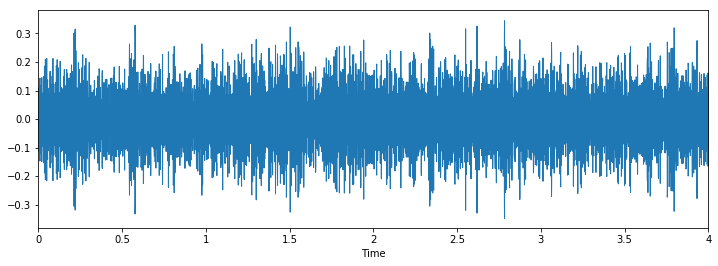

In [6]:
# Class: Air Conditioner

filename = '../Capstone_Project_2/train/Train/24.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

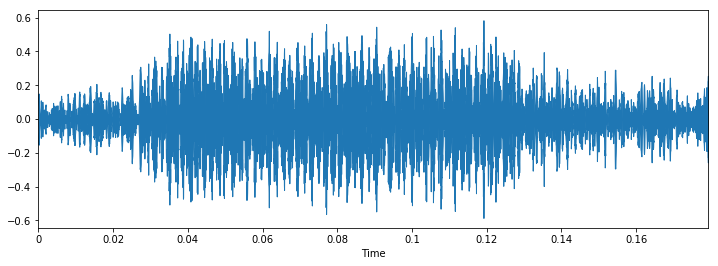

In [7]:
# Class: Car Horn

filename = '../Capstone_Project_2/train/Train/48.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

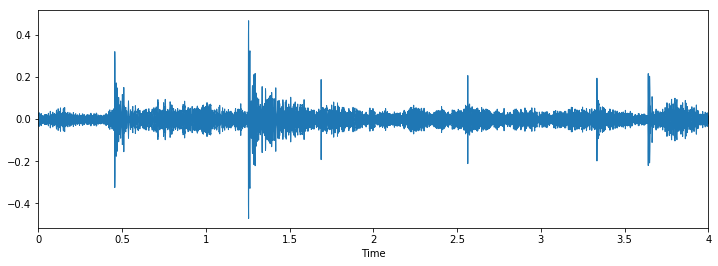

In [8]:
# Class:Children Playing

filename = '../Capstone_Project_2/train/Train/6.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

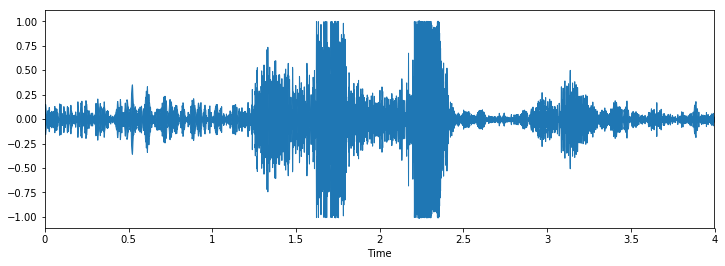

In [9]:
# Class: Dog Bark

filename = '../Capstone_Project_2/train/Train/4.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

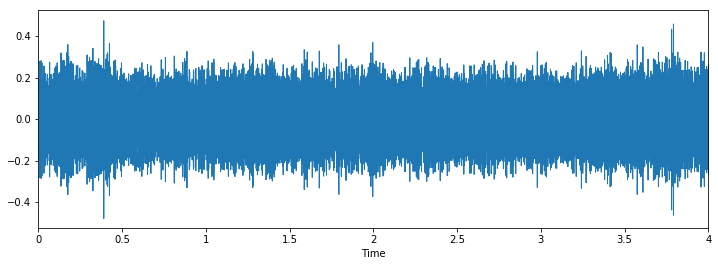

In [10]:
# Class: Drilling

filename = '../Capstone_Project_2/train/Train/11.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

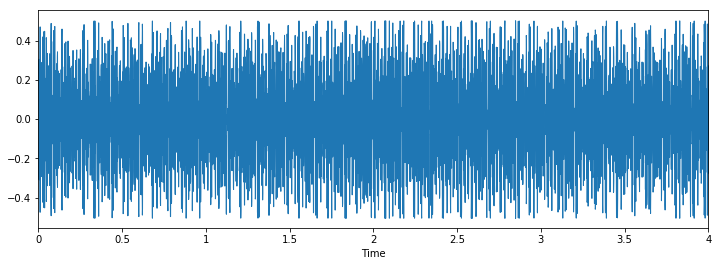

In [11]:
# Class: Engine Idling

filename = '../Capstone_Project_2/train/Train/17.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

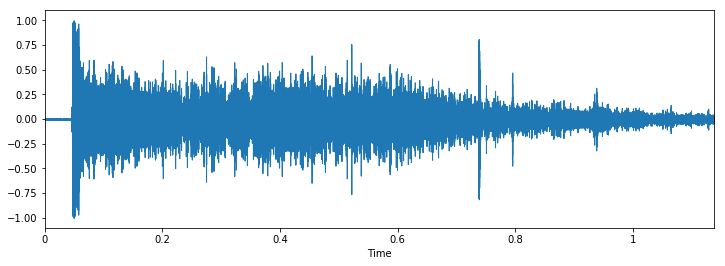

In [12]:
# Class: Gun Shot

filename = '../Capstone_Project_2/train/Train/12.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

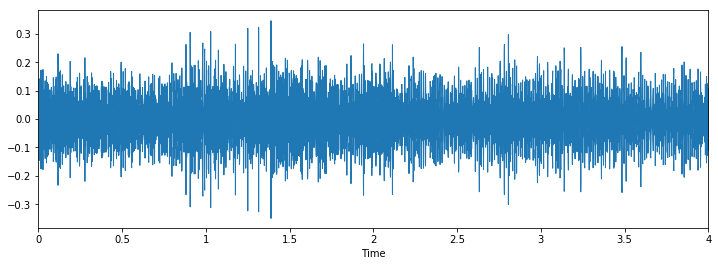

In [13]:
# Class: Jackhammer

filename = '../Capstone_Project_2/train/Train/33.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

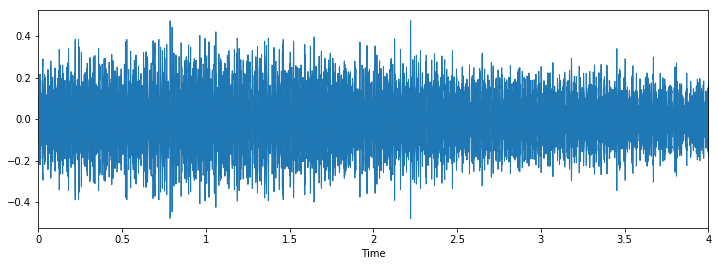

In [14]:
# Class: Siren

filename = '../Capstone_Project_2/train/Train/0.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

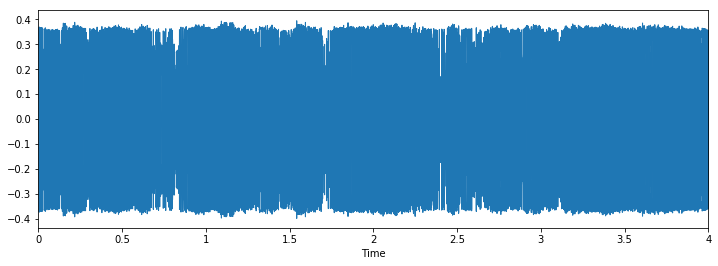

In [15]:
# Class: Street Music

filename = '../Capstone_Project_2/train/Train/1.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

In [16]:
import pandas as pd
metadata = pd.read_csv('../Capstone_Project_2/train/train.csv')
metadata.head()

,ID,Class
0,0,siren
1,1,street_music
2,2,drilling
3,3,siren
4,4,dog_bark


In [17]:
print(metadata['Class'].value_counts())

jackhammer          668
engine_idling       624
siren               607
drilling            600
air_conditioner     600
children_playing    600
dog_bark            600
street_music        600
car_horn            306
gun_shot            230
Name: Class, dtype: int64


## 2. Data Preprocessing
### Obtain sound file's sampling rate, number of channels, bit depth

In [18]:
import soundfile as sf

ob = sf.SoundFile('../Capstone_Project_2/train/Train/105.wav')
print('Sample rate: {}'.format(ob.samplerate))
print('Channels: {}'.format(ob.channels))
print('Subtype: {}'.format(ob.subtype))

Sample rate: 48000
Channels: 2
Subtype: PCM_24


In [19]:
import os, fnmatch

listOfFiles = os.listdir('../Capstone_Project_2/train/Train/')
pattern = "*.wav"
file=[]
for entry in listOfFiles:
    if fnmatch.fnmatch(entry, pattern):
            file.append(entry)

In [20]:
df=pd.DataFrame(file)

In [21]:
new_df=df.rename(columns = {0: "File_Name"}) 

In [22]:
new_df['ID'] = new_df['File_Name'].str.split('.').str[0]

In [23]:
new_df.head()

,File_Name,ID
0,4666.wav,4666
1,2217.wav,2217
2,7409.wav,7409
3,1078.wav,1078
4,6717.wav,6717


In [24]:
train_data=pd.read_csv('../Capstone_Project_2/train/train.csv')
train_data.head()

,ID,Class
0,0,siren
1,1,street_music
2,2,drilling
3,3,siren
4,4,dog_bark


In [25]:
new_df['ID'] = new_df['ID'].astype(int)

In [26]:
df_merge = new_df.merge(train_data,on='ID')

In [27]:
df_merge.head()

,File_Name,ID,Class
0,4666.wav,4666,engine_idling
1,2217.wav,2217,engine_idling
2,7409.wav,7409,drilling
3,1078.wav,1078,car_horn
4,6717.wav,6717,children_playing


In [28]:
from pathlib import Path
import soundfile as sf
data_folder = Path("../Capstone_Project_2/train/Train/")
sample_rate = []
num_channel = []
bit_depth = []
for name in df_merge['File_Name']:
    ob = sf.SoundFile(data_folder / name)
    sample_rate.append(ob.samplerate)
    num_channel.append(ob.channels)
    bit_depth.append(ob.subtype)

In [29]:
sound_file = pd.DataFrame(
    {'File_Name': file,
     'sample_rate': sample_rate,
     'num_channel': num_channel,
     'bit_depth':bit_depth
    })

In [31]:
combined = df_merge.merge(sound_file,on='File_Name')

In [32]:
combined.head()

,File_Name,ID,Class,sample_rate,num_channel,bit_depth
0,4666.wav,4666,engine_idling,44100,2,PCM_16
1,2217.wav,2217,engine_idling,48000,1,PCM_24
2,7409.wav,7409,drilling,44100,2,PCM_16
3,1078.wav,1078,car_horn,44100,2,PCM_16
4,6717.wav,6717,children_playing,44100,2,PCM_16


In [33]:
print(combined['bit_depth'].value_counts(normalize=True))

PCM_16       0.667341
PCM_24       0.302668
FLOAT        0.021711
PCM_U8       0.007912
MS_ADPCM     0.000184
IMA_ADPCM    0.000184
Name: bit_depth, dtype: float64


In [34]:
print(combined['sample_rate'].value_counts(normalize=True))

44100    0.598896
48000    0.305980
96000    0.066053
24000    0.009752
16000    0.007176
22050    0.006624
11025    0.003680
8000     0.001104
32000    0.000736
Name: sample_rate, dtype: float64


### Note
#### 'PCM_16':    0x0002,  # Signed 16 bit data
#### 'PCM_24':    0x0003,  # Signed 24 bit data
#### 'PCM_U8':    0x0005,  # Unsigned 8 bit data (WAV and RAW only)
#### 'FLOAT':     0x0006,  # 32 bit float data
#### 'IMA_ADPCM': 0x0012,  # IMA ADPCM.
##### (IMA/DVI ADPCM is a standard that compresses 16-bit sound data into only 4-bits)
#### 'MS_ADPCM':  0x0013,  # Microsoft ADPCM.
##### (MS_ADPCM compresses 16-bit sound data into 4-bit data)
####    
####    
####     



#### Export extracted dataframe into a new csv file called 'train_detail.csv'

In [35]:
combined.to_csv('train_detail.csv')

In [36]:
import librosa 
from scipy.io import wavfile as wav
import numpy as np

filename = '../Capstone_Project_2/train/Train/4666.wav' 

librosa_audio, librosa_sample_rate = librosa.load(filename) 
scipy_sample_rate, scipy_audio = wav.read(filename) 

print('Original sample rate:', scipy_sample_rate) 
print('Librosa sample rate:', librosa_sample_rate)

Original sample rate: 44100
Librosa sample rate: 22050


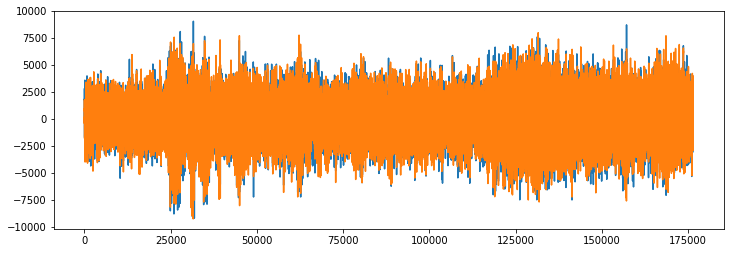

In [37]:
import matplotlib.pyplot as plt

# Original audio with 2 channels 
plt.figure(figsize=(12, 4))
plt.plot(scipy_audio)

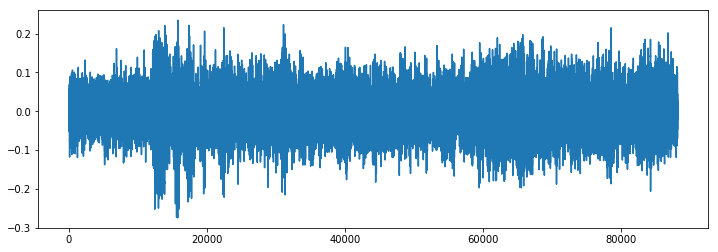

In [38]:
plt.figure(figsize=(12, 4))
plt.plot(librosa_audio)

In [67]:
mfccs = librosa.feature.mfcc(y=librosa_audio, sr=librosa_sample_rate, n_mfcc=40)
print(mfccs.shape)

(40, 173)


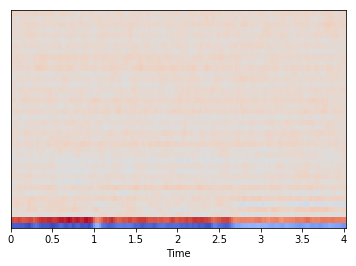

In [68]:
import librosa.display
librosa.display.specshow(mfccs, sr=librosa_sample_rate, x_axis='time')

In [41]:
def extract_features(file_name):
   
    try:
        audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
        mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
        mfccsscaled = np.mean(mfccs.T,axis=0)
        
    except Exception as e:
        print("Error encountered while parsing file: ", file)
        return None 
     
    return mfccsscaled

In [42]:
import pandas as pd
import os
import librosa

# Set the path to the full UrbanSound dataset 
fulldatasetpath = '../Capstone_Project_2/train/Train/'

metadata = pd.read_csv('../Capstone_Project_2/train_detail.csv')

features = []

# Iterate through each sound file and extract the features 
for index, row in metadata.iterrows():
    
    file_name = os.path.join(os.path.abspath(fulldatasetpath)+'/',str(row["File_Name"]))
    
    class_label = row["Class"]
    data = extract_features(file_name)
    
    features.append([data, class_label])

# Convert into a Panda dataframe 
featuresdf = pd.DataFrame(features, columns=['feature','class_label'])

print('Finished feature extraction from ', len(featuresdf), ' files')

Finished feature extraction from  5435  files


In [43]:
featuresdf.head()

,feature,class_label
0,"[-148.29195, 125.17131, -18.48167, 13.752467, ...",engine_idling
1,"[-216.45773, 175.77246, 0.244275, 65.77827, 6....",engine_idling
2,"[-193.82822, 105.66298, -39.473175, 32.525784,...",drilling
3,"[-143.99443, 111.079796, -33.822388, 46.725525...",car_horn
4,"[-261.05377, 119.62229, -55.061405, 31.013195,...",children_playing


### Convert the data and labels
#### We will use sklearn.preprocessing.LabelEncoder(one-hot coding) to encode the categorical text data into model-understandable numerical data.

In [44]:
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

# Convert features and corresponding classification labels into numpy arrays
X = np.array(featuresdf.feature.tolist())
y = np.array(featuresdf.class_label.tolist())

# Encode the classification labels
le = LabelEncoder()
yy = to_categorical(le.fit_transform(y))

In [66]:
%store 'X'
%store 'yy'

Stored 'X' (ndarray)
Stored 'yy' (ndarray)
